In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import copy
import matplotlib.pyplot as plt
import plotly
plotly.offline.init_notebook_mode (connected = True)

In [2]:
plt.rcParams['figure.dpi'] = 500

from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression

from sklearn.model_selection import train_test_split

In [3]:
data=pd.read_csv('../input/kaggle-survey-2020/kaggle_survey_2020_responses.csv',low_memory=False)

In [4]:
data.head()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,...,Q35_B_Part_2,Q35_B_Part_3,Q35_B_Part_4,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education ...,Select the title most similar to your current ...,For how many years have you been writing code ...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,...,"In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor..."
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,TensorBoard,NaN,NaN,NaN,NaN,NaN,NaN
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,NaN,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
#data = pd.read_csv("/kaggle/input/kaggle-survey-2020/kaggle_survey_2020_responses.csv")
questions = data.iloc[0, :].T
data.head()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,...,Q35_B_Part_2,Q35_B_Part_3,Q35_B_Part_4,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education ...,Select the title most similar to your current ...,For how many years have you been writing code ...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,...,"In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor..."
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,TensorBoard,NaN,NaN,NaN,NaN,NaN,NaN
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,NaN,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Changing the names of the columns to that of the first row !! and then removing the first row

In [6]:
# Code to change the name of the columns
data.columns=data.iloc[0,:].values

In [7]:
# code to remove the first row
data.drop(index=0,inplace=True)

Having a look at the data after the changes

In [8]:
data[data.columns[:20]]

,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education that you have attained or plan to attain within the next 2 years?,Select the title most similar to your current role (or most recent title if retired): - Selected Choice,For how many years have you been writing code and/or programming?,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Python,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - R,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - SQL,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - C,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - C++,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Java,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Javascript,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Julia,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Swift,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Bash,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - MATLAB,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - None,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Other
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,C,NaN,NaN,Javascript,NaN,NaN,NaN,MATLAB,NaN,Other
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,NaN,NaN,NaN,NaN,NaN,Java,Javascript,NaN,NaN,Bash,NaN,NaN,NaN
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,NaN,SQL,NaN,NaN,NaN,NaN,NaN,NaN,Bash,NaN,NaN,NaN
5,78,30-34,Man,Japan,Master’s degree,Software Engineer,3-5 years,Python,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20032,126,18-21,Man,Turkey,Some college/university study without earning ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20033,566,55-59,Woman,United Kingdom of Great Britain and Northern I...,Master’s degree,Currently not employed,20+ years,Python,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20034,238,30-34,Man,Brazil,Master’s degree,Research Scientist,< 1 years,Python,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20035,625,22-24,Man,India,Bachelor’s degree,Software Engineer,3-5 years,Python,NaN,SQL,C,NaN,Java,Javascript,NaN,NaN,NaN,NaN,NaN,NaN


# So we take the first 20 data columns

In [9]:
df=data[data.columns[:20]]

In [10]:
# So we are dropping all the rows with nan values in the first 5 columns
data.dropna(subset=data.columns[:6],inplace=True)

In [11]:
# having the look at the data

In [12]:
data.head()

,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education that you have attained or plan to attain within the next 2 years?,Select the title most similar to your current role (or most recent title if retired): - Selected Choice,For how many years have you been writing code and/or programming?,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Python,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - R,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - SQL,...,"In the next 2 years, do you hope to become more familiar with any of these tools for managing ML experiments? (Select all that apply) - Selected Choice - Weights & Biases","In the next 2 years, do you hope to become more familiar with any of these tools for managing ML experiments? (Select all that apply) - Selected Choice - Comet.ml","In the next 2 years, do you hope to become more familiar with any of these tools for managing ML experiments? (Select all that apply) - Selected Choice - Sacred + Omniboard","In the next 2 years, do you hope to become more familiar with any of these tools for managing ML experiments? (Select all that apply) - Selected Choice - TensorBoard","In the next 2 years, do you hope to become more familiar with any of these tools for managing ML experiments? (Select all that apply) - Selected Choice - Guild.ai","In the next 2 years, do you hope to become more familiar with any of these tools for managing ML experiments? (Select all that apply) - Selected Choice - Polyaxon","In the next 2 years, do you hope to become more familiar with any of these tools for managing ML experiments? (Select all that apply) - Selected Choice - Trains","In the next 2 years, do you hope to become more familiar with any of these tools for managing ML experiments? (Select all that apply) - Selected Choice - Domino Model Monitor","In the next 2 years, do you hope to become more familiar with any of these tools for managing ML experiments? (Select all that apply) - Selected Choice - None","In the next 2 years, do you hope to become more familiar with any of these tools for managing ML experiments? (Select all that apply) - Selected Choice - Other"
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,TensorBoard,NaN,NaN,NaN,NaN,NaN,NaN
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,NaN,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,78,30-34,Man,Japan,Master’s degree,Software Engineer,3-5 years,Python,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
df.head()

,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education that you have attained or plan to attain within the next 2 years?,Select the title most similar to your current role (or most recent title if retired): - Selected Choice,For how many years have you been writing code and/or programming?,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Python,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - R,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - SQL,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - C,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - C++,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Java,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Javascript,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Julia,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Swift,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Bash,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - MATLAB,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - None,What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Other
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,C,NaN,NaN,Javascript,NaN,NaN,NaN,MATLAB,NaN,Other
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,NaN,NaN,NaN,NaN,NaN,Java,Javascript,NaN,NaN,Bash,NaN,NaN,NaN
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,NaN,SQL,NaN,NaN,NaN,NaN,NaN,NaN,Bash,NaN,NaN,NaN
5,78,30-34,Man,Japan,Master’s degree,Software Engineer,3-5 years,Python,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
# here we gonna put all the names of the countries in the variable a and all the values of the counts in 
# variable b
a=data['In which country do you currently reside?'].value_counts().index
b=data['In which country do you currently reside?'].value_counts().values

In [15]:
a=list(a)
b=list(b)

In [16]:
import plotly.graph_objects as go

import pandas as pd

fig = go.Figure(data=go.Choropleth(
    locations=a, # Spatial coordinates
    z = b, # Data to be color-coded
    locationmode = 'country names', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "Millions",
))

fig.update_layout(
    title_text = 'Data Analysis on the basis of number of survey in different countries',
    geo_scope='world', # limite map scope to USA
)

fig.show()

In [17]:
gg=data.groupby(['What is your age (# years)?','What is your gender? - Selected Choice']).count()


In [18]:
indexx=np.array(gg.index)


In [19]:
age_group=pd.DataFrame()


In [20]:
indexx=np.array(list(indexx))


In [21]:
len(indexx[:,1])


50

In [22]:
len(indexx[:,1])


50

In [23]:
#px.bar(data_frame=age_group,x='Age',y='Number',color='Gender',template='plotly_dark')


[(0.0, 1e-06), (0.0, 200000.0)]

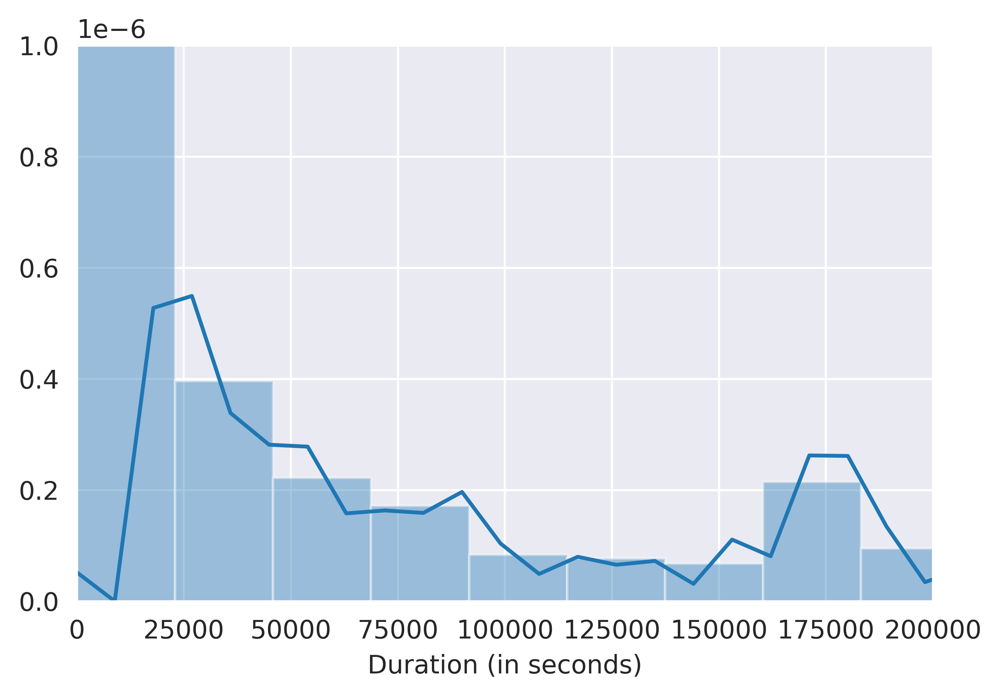

In [24]:
import seaborn as sns
sns.set_style("darkgrid")
pt=sns.distplot(data['Duration (in seconds)'])
pt.set(xlim=(0,200000),ylim={0,0.000001})

In [25]:
nam=data['Select the title most similar to your current role (or most recent title if retired): - Selected Choice'].value_counts()

In [26]:
px.pie(values=nam.values,names=nam.index)


In [27]:
salary_order = ['$0-999', '1,000-1,999', '2,000-2,999', '3,000-3,999', 
                '4,000-4,999', '5,000-7,499', '7,500-9,999', '10,000-14,999',
                '15,000-19,999', '20,000-24,999', '25,000-29,999', 
                '30,000-39,999', '40,000-49,999', '50,000-59,999', 
                '60,000-69,999', '70,000-79,999', '80,000-89,999', 
                '90,000-99,999', '100,000-124,999', '125,000-149,999',
                '150,000-199,999', '200,000-249,999', '250,000-299,999', 
                '300,000-500,000', '> $500,000']
salary = data['What is your current yearly compensation (approximate $USD)?'].fillna('unknown').value_counts()[salary_order]

px.bar(x = salary, 
         y = salary.index)

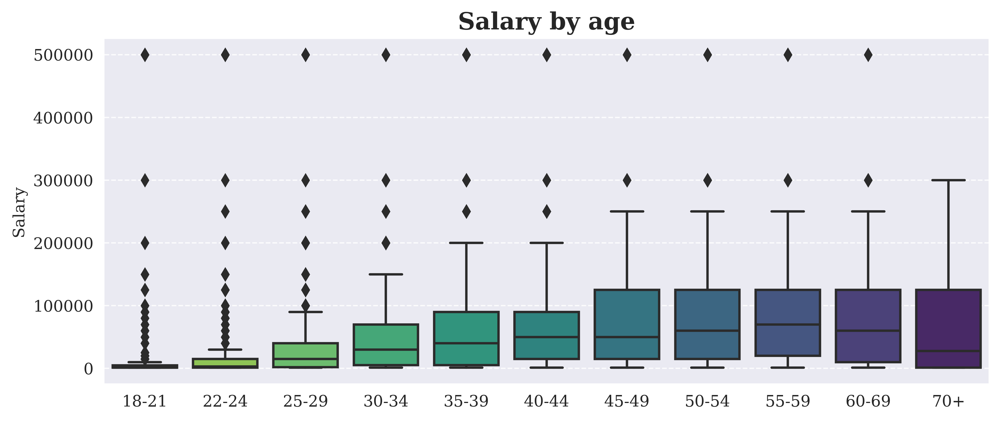

<Figure size 9000x4000 with 0 Axes>

<Figure size 9000x4000 with 0 Axes>

In [28]:
max_salary = data['What is your current yearly compensation (approximate $USD)?'].fillna('unknown-unknown') \
    .apply(lambda x: x.replace('$', '') \
    .replace('> 500,000', '500,000-500,000') \
    .replace(',', '') \
    .split("-")[1]).replace('unknown', np.nan).astype('float64') + 1

new_df = pd.DataFrame({'max_salary': max_salary, 'age': df['What is your age (# years)?']})
def horizontal_boxplot(data, title, xlabel, order = None):
    fig, ax = plt.subplots(1, 1, figsize=(10, 4))
    plt.title(title, size = 15, fontweight = 'bold', fontfamily = 'serif')
    
    for i in ['top', 'right', 'bottom', 'left']:
        ax.spines[i].set_visible(False)
    
    sns.boxplot(x = data, y = new_df.max_salary, ax = ax,
                palette = reversed(sns.color_palette("viridis", data.nunique())),
                order = order)
    plt.xlabel('')
    plt.ylabel('Salary', fontfamily = 'serif')    
    plt.xticks(fontfamily = 'serif')
    plt.yticks(fontfamily = 'serif')
    ax.grid(axis = 'y', linestyle = '--', alpha = 0.9)
    plt.show()
    

def vertical_boxplot(data, title, ylabel, order = None):
    fig, ax = plt.subplots(1, 1, figsize=(10, 4))
    plt.title(title, size = 15, fontweight = 'bold', fontfamily = 'serif')
    
    for i in ['top', 'right', 'bottom', 'left']:
        ax.spines[i].set_visible(False)
    
    sns.boxplot(y = data, x = new_df.max_salary, ax = ax,
                palette = reversed(sns.color_palette("viridis", data.nunique())),
                order = order)
    plt.xlabel('Salary', fontfamily = 'serif')
    plt.ylabel('')   
    plt.xticks(fontfamily = 'serif')
    plt.yticks(fontfamily = 'serif')
    ax.grid(axis = 'x', linestyle = '--', alpha = 0.9)
    plt.show()
horizontal_boxplot(new_df.age.sort_values(ascending = True), 
                   'Salary by age', 'Age')
plt.figure(figsize=(18,8))

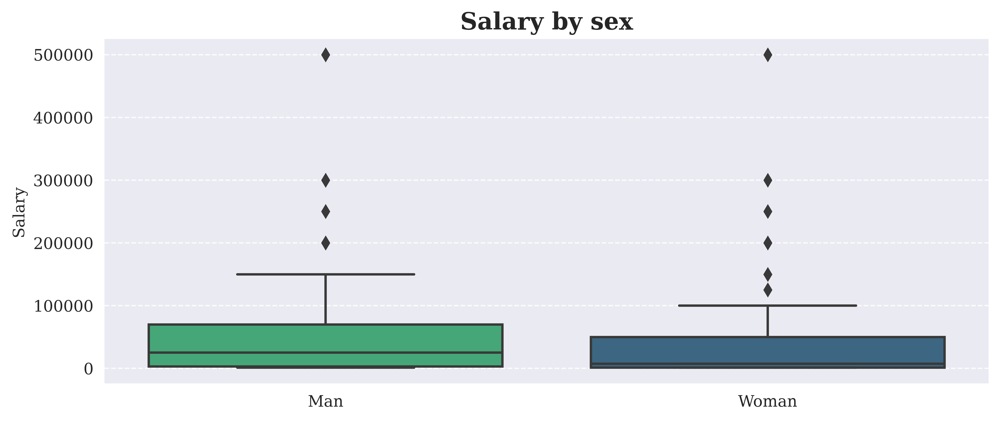

<Figure size 9000x4000 with 0 Axes>

<Figure size 9000x4000 with 0 Axes>

In [29]:
new_df['sex'] = df['What is your gender? - Selected Choice']

horizontal_boxplot(new_df.sex[new_df.sex.isin(['Man', 'Woman'])], 
                   'Salary by sex', 'Sex')
plt.figure(figsize=(18,8))

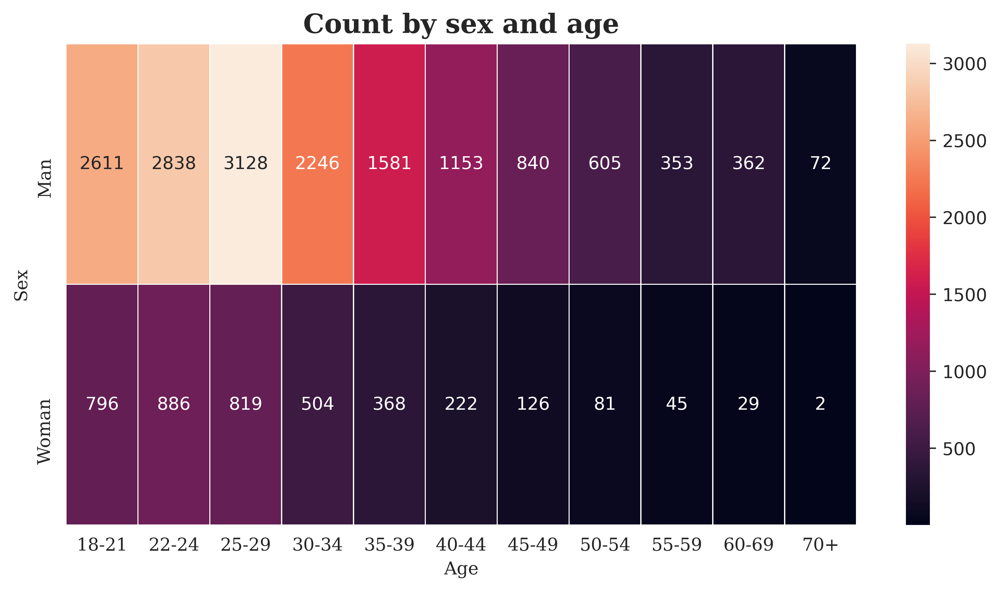

In [30]:
hm = pd.DataFrame(new_df[new_df.sex.isin(['Man', 'Woman'])][['sex', 'age']] \
                  .value_counts()).reset_index().pivot('sex', 'age', 0) \
                  .fillna(0).astype('int')

plt.figure(figsize=(10, 5))
plt.title('Count by sex and age', size = 15, fontweight = 'bold', fontfamily = 'serif')
sns.heatmap(hm, annot = True, fmt = "d", linewidths=.5)
plt.xlabel('Age', fontfamily = 'serif')
plt.ylabel('Sex', fontfamily = 'serif')
plt.xticks(fontfamily = 'serif')
plt.yticks(fontfamily = 'serif')
plt.show()

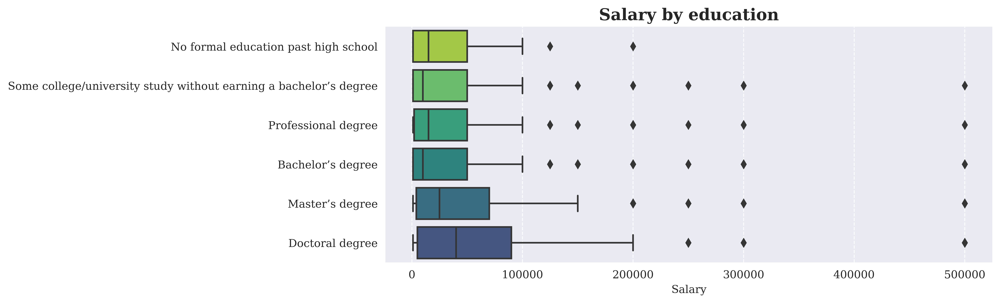

In [31]:
education_order = ['No formal education past high school', 
              'Some college/university study without earning a bachelor’s degree',
              'Professional degree', 'Bachelor’s degree', 
              'Master’s degree', 'Doctoral degree']
new_df['education'] = df['What is the highest level of formal education that you have attained or plan to attain within the next 2 years?']

vertical_boxplot(new_df.education, 'Salary by education', 
                 'Education', order = education_order)

In [32]:
reg_pl = df.iloc[:, 7:20].apply(lambda x: [x.dropna().unique()[0], 
                                           x.count()], axis = 0).T
reg_pl.columns = ['lang', 'count']
reg_pl['perc'] = reg_pl['count'] / len(df) * 100
reg_pl = reg_pl.sort_values('perc', ascending = False)

#bar_plot(x = reg_pl.perc, 
 #        y = reg_pl.lang,
   #      title = 'Programming languages that respondents use on a regular basis',
  #       palette_len = reg_pl.lang, 
    #     xlim = (0, 80), 
     #    xticklabels = range(0, 81, 10),
      #   yticklabels = reg_pl.lang,
       #  left_visible = True, xlabel = 'Part of respondents (%)',
        # figsize = (10, 5), axis_grid = 'x')

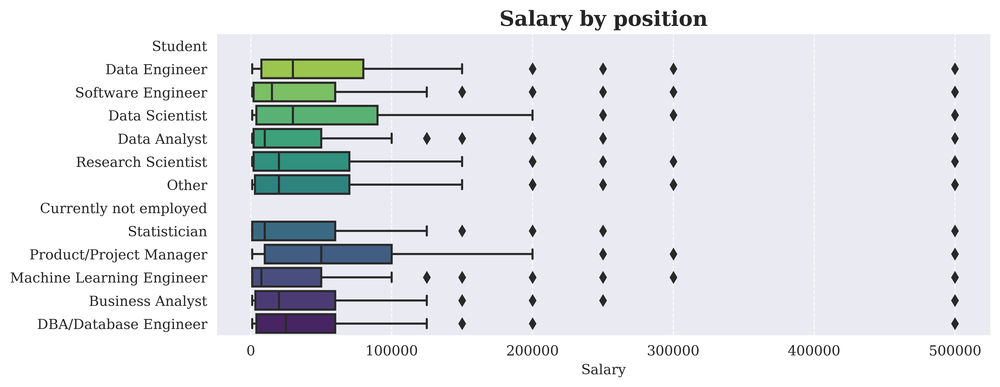

In [33]:
new_df['position'] = df['Select the title most similar to your current role (or most recent title if retired): - Selected Choice']

vertical_boxplot(new_df.position, 'Salary by position', 'Position')

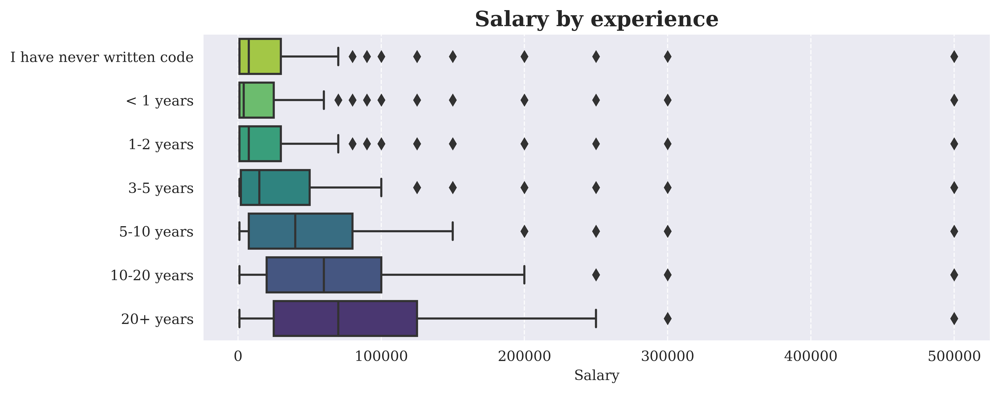

In [34]:
exp_order = ['I have never written code', '< 1 years', '1-2 years', 
             '3-5 years', '5-10 years', '10-20 years', '20+ years']
new_df['experience'] = df['For how many years have you been writing code and/or programming?']

vertical_boxplot(new_df.experience, 'Salary by experience', 
                 'Experience', order = exp_order)

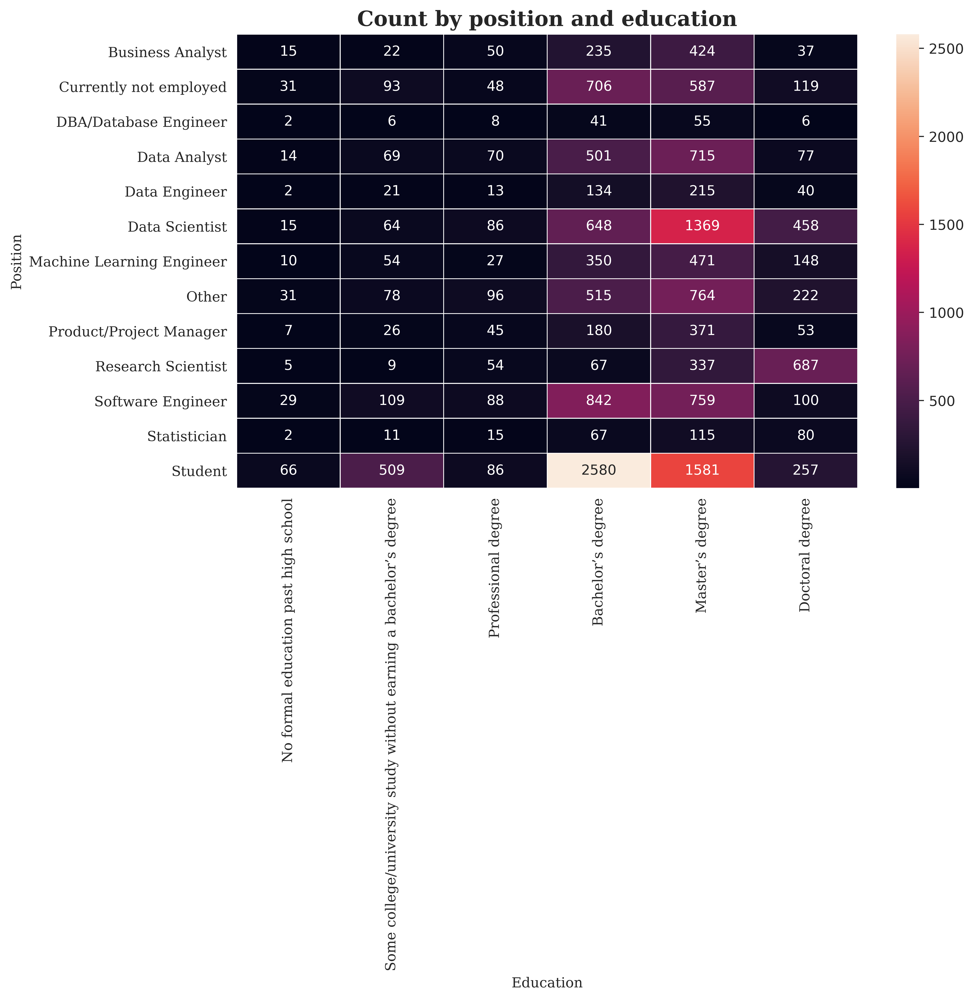

In [35]:
hm = pd.DataFrame(new_df[['position', 'education']].value_counts()) \
    .reset_index().pivot('position', 'education', 0) \
    .fillna(0).astype('int')[education_order]

plt.figure(figsize=(10, 6))
plt.title('Count by position and education', size = 15, 
          fontweight = 'bold', fontfamily = 'serif')
sns.heatmap(hm, annot = True, fmt = "d", linewidths=.5)

plt.xlabel('Education', fontfamily = 'serif')
plt.ylabel('Position', fontfamily = 'serif')
plt.xticks(fontfamily = 'serif')
plt.yticks(fontfamily = 'serif')
plt.show()

In [36]:
top_countries = df['In which country do you currently reside?'].value_counts()
top_countries = top_countries[top_countries.index != 'Other'][:30]

#bar_plot(x = top_countries, 
 #        y = top_countries.index,
  #       title = 'TOP countries by Kaggle users',
   #      palette_len = top_countries.index, 
    #     xlim = (0, 6000), 
     #    xticklabels = range(0, 6001, 1000),
      #   yticklabels = top_countries.index,
       #  left_visible = True,
        # figsize = (10, 8), axis_grid = 'x')

In [37]:
recomend_pl = data['What programming language would you recommend an aspiring data scientist to learn first? - Selected Choice'].value_counts().reset_index()
recomend_pl.columns = ['lang', 'count']
recomend_pl['perc'] = recomend_pl['count'] / len(data) * 100
recomend_pl = recomend_pl.sort_values('perc', ascending = False)

px.bar(x = recomend_pl.perc, 
         y = recomend_pl.lang,template='presentation')

In [38]:
data = pd.read_csv("/kaggle/input/kaggle-survey-2020/kaggle_survey_2020_responses.csv")
questions = data.iloc[0, :].T
data.head()

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning:

Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.



,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,...,Q35_B_Part_2,Q35_B_Part_3,Q35_B_Part_4,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education ...,Select the title most similar to your current ...,For how many years have you been writing code ...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,...,"In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor..."
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,TensorBoard,NaN,NaN,NaN,NaN,NaN,NaN
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,NaN,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [39]:
data1 = data.iloc[1:,:]
data1.head()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,...,Q35_B_Part_2,Q35_B_Part_3,Q35_B_Part_4,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,TensorBoard,NaN,NaN,NaN,NaN,NaN,NaN
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,NaN,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,78,30-34,Man,Japan,Master’s degree,Software Engineer,3-5 years,Python,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


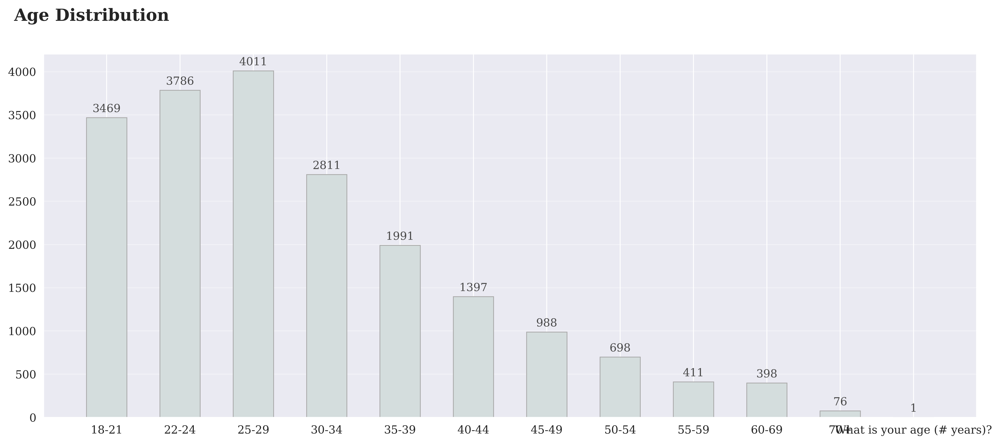

In [40]:
fig, ax = plt.subplots(1,1, figsize=(15,6))
data_q1 = data['Q1'].value_counts().sort_index()
ax.bar(data_q1.index, data_q1, width=0.55, 
       edgecolor='darkgray', color='#d4dddd',
      linewidth=0.7)

for i in data_q1.index:
    ax.annotate(f"{data_q1[i]}",
                xy=(i, data_q1[i] + 100),
               va ='center', ha='center', fontweight='light',
               fontfamily='serif', color='#4a4a4a')
    
for s in ['top', 'left', 'right']:
    ax.spines[s].set_visible(False)
    
ax.set_ylim(0,4200)
ax.set_xticklabels(data_q1.index, fontfamily='serif')
ax.set_yticklabels(np.arange(0, 4001, 500), fontfamily='serif')
fig.text(0.1, 0.95, 'Age Distribution', fontsize=15, fontweight='bold',
        fontfamily='serif')
ax.grid(axis='y', linestyle='-', alpha=0.4)
plt.show()

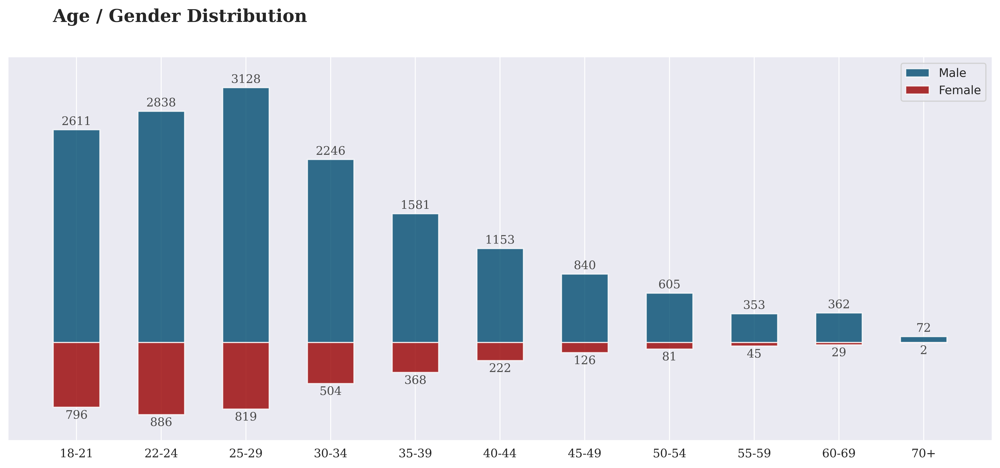

In [41]:
data['Q2'] = data['Q2'].apply(lambda x : 'ETC' if x not in ['Man', 
                                                             'Woman']
                              else x)
data_q1q2=data[data['Q2'] != 'ETC'].groupby(['Q2'])['Q1'].value_counts().unstack().sort_index()
man = data_q1q2.loc['Man']
woman = -data_q1q2.loc['Woman']

fig, ax = plt.subplots(1,1, figsize=(15,6))
ax.bar(man.index, man, width=0.55, color='#004c70', alpha=0.8,
      label='Male')
ax.bar(woman.index, woman, width=0.55, color='#990000', alpha=0.8, 
      label='Female')
ax.set_ylim(-1200,3500)

for i in man.index:
    ax.annotate(f"{man[i]}",
               xy=(i, man[i] + 100),
               va = 'center', ha='center', fontweight='light',
               fontfamily='serif', color='#4a4a4a')
    
for i in woman.index:
    ax.annotate(f"{-woman[i]}",
               xy=(i, woman[i] - 100),
               va = 'center', ha='center', fontweight='light',
               fontfamily='serif', color='#4a4a4a')
    
for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)
    
ax.set_xticklabels(data_q1q2.columns, fontfamily='serif')
ax.set_yticks([])
ax.legend()
fig.text(0.16, 0.95, 'Age / Gender Distribution', fontsize=15,
        fontweight='bold', fontfamily='serif')
plt.show()

In [42]:
d2= data1[['Time from Start to Finish (seconds)','Q1','Q6','Q13','Q15','Q20','Q21','Q24','Q25']]
d1= data1[['Q1','Q6','Q13','Q15','Q20','Q21','Q24','Q25']]

d1.head()

,Q1,Q6,Q13,Q15,Q20,Q21,Q24,Q25
1,35-39,5-10 years,2-5 times,1-2 years,NaN,NaN,NaN,NaN
2,30-34,5-10 years,2-5 times,1-2 years,"10,000 or more employees",20+,"100,000-124,999","$100,000 or more ($USD)"
3,35-39,10-20 years,Never,I do not use machine learning methods,"1000-9,999 employees",0,"15,000-19,999",$0 ($USD)
4,30-34,5-10 years,2-5 times,3-4 years,250-999 employees,5-9,"125,000-149,999","$10,000-$99,999"
5,30-34,3-5 years,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
d1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20036 entries, 1 to 20036
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Q1      20036 non-null  object
 1   Q6      19120 non-null  object
 2   Q13     16780 non-null  object
 3   Q15     16374 non-null  object
 4   Q20     11403 non-null  object
 5   Q21     11282 non-null  object
 6   Q24     10729 non-null  object
 7   Q25     10570 non-null  object
dtypes: object(8)
memory usage: 1.2+ MB


In [44]:
d1.dropna(subset=['Q24'], inplace = True)
d1.dropna(inplace = True)
d1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10034 entries, 2 to 20036
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Q1      10034 non-null  object
 1   Q6      10034 non-null  object
 2   Q13     10034 non-null  object
 3   Q15     10034 non-null  object
 4   Q20     10034 non-null  object
 5   Q21     10034 non-null  object
 6   Q24     10034 non-null  object
 7   Q25     10034 non-null  object
dtypes: object(8)
memory usage: 705.5+ KB


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [45]:
d1['Q1'].value_counts()

25-29    2211
30-34    1860
35-39    1354
22-24    1333
40-44     962
45-49     725
50-54     504
18-21     469
60-69     287
55-59     279
70+        50
Name: Q1, dtype: int64

In [46]:
d1.Q1[d1.Q1 == '25-29'] = (25+29)/2
d1.Q1[d1.Q1 == '30-34'] = (30+34)/2
d1.Q1[d1.Q1 == '35-39'] = (35+39)/2
d1.Q1[d1.Q1 == '40-44'] = (40+44)/2
d1.Q1[d1.Q1 == '45-49'] = (45+49)/2
d1.Q1[d1.Q1 == '50-54'] = (50+54)/2
d1.Q1[d1.Q1 == '55-59'] = (55+59)/2
d1.Q1[d1.Q1 == '60-69'] = (60+69)/2
d1.Q1[d1.Q1 == '22-24'] = (22+24)/2
d1.Q1[d1.Q1 == '70+'] = (70+80)/2
d1.Q1[d1.Q1 == '18-21'] = (18+21)/2

/opt/conda/lib/python3.7/site-packages/pandas/core/series.py:1020: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [47]:
d1.Q6[d1.Q6 == '3-5 years'] = (3+5)/2
d1.Q6[d1.Q6 == '1-2 years'] = (1+2)/2
d1.Q6[d1.Q6 == '5-10 years'] = (5+10)/2
d1.Q6[d1.Q6 == '10-20 years'] = (10+20)/2
d1.Q6[d1.Q6 == '< 1 years'] = (1)/2
d1.Q6[d1.Q6 == '20+ years'] = (20+30)/2
d1.Q6[d1.Q6 == 'I have never written code'] = 0

In [48]:
d1.Q13[d1.Q13 == 'Never'] = (0)/2
d1.Q13[d1.Q13 == '2-5 times'] = (2+5)/2
d1.Q13[d1.Q13 == 'Once'] = 1
d1.Q13[d1.Q13 == '6-25 times'] = (6+25)/2
d1.Q13[d1.Q13 == 'More than 25 times'] = (25+35)/2



In [49]:
d1.Q15[d1.Q15 == 'Under 1 year'] = (1)/2
d1.Q15[d1.Q15 == '1-2 years'] = (1+2)/2
d1.Q15[d1.Q15 == '2-3 years'] = (2+3)/2
d1.Q15[d1.Q15 == 'I do not use machine learning methods'] = (0)/2
d1.Q15[d1.Q15 == '3-4 years'] = (3+4)/2
d1.Q15[d1.Q15 == '5-10 years'] = (5+10)/2
d1.Q15[d1.Q15 == '4-5 years'] = (4+5)/2
d1.Q15[d1.Q15 == '10-20 years'] = (10+20)/2
d1.Q15[d1.Q15 == '20 or more years'] = (20+30)/2

In [50]:
d1.Q20[d1.Q20 == '0-49 employees'] = (0+49)/2
d1.Q20[d1.Q20 == '10,000 or more employees'] = 15000
d1.Q20[d1.Q20 == '1000-9,999 employees'] = (1000+9999)/2
d1.Q20[d1.Q20 == '50-249 employees'] = (50+249)/2
d1.Q20[d1.Q20 == '250-999 employees'] = (250+999)/2

In [51]:
d1.Q21[d1.Q21 == '1-2'] = (1+2)/2
d1.Q21[d1.Q21 == '20+'] = 25
d1.Q21[d1.Q21 == '0'] = 0
d1.Q21[d1.Q21 == '3-4'] = (3+4)/2
d1.Q21[d1.Q21 == '5-9'] = (5+9)/2
d1.Q21[d1.Q21 == '10-14'] = (10+14)/2
d1.Q21[d1.Q21 == '15-19'] = (15+19)/2

In [52]:
d1.Q24[d1.Q24 == '$0-999'] = (0+999)/2
d1.Q24[d1.Q24 == '10,000-14,999'] = 12500
d1.Q24[d1.Q24 == '1,000-1,999'] = 1500
d1.Q24[d1.Q24 == '100,000-124,999'] = (100000+124999)/2
d1.Q24[d1.Q24 == '40,000-49,999'] = 45000
d1.Q24[d1.Q24 == '30,000-39,999'] = 35000
d1.Q24[d1.Q24 == '50,000-59,999'] = 55000
d1.Q24[d1.Q24 == '5,000-7,499'] = (5000+7499)/2
d1.Q24[d1.Q24 == '15,000-19,999'] = (15000+19999)/2
d1.Q24[d1.Q24 == '60,000-69,999'] = (60000+69999)/2
d1.Q24[d1.Q24 == '20,000-24,999'] = (20000+24999)/2
d1.Q24[d1.Q24 == '70,000-79,999'] = 75000
d1.Q24[d1.Q24 == '7,500-9,999'] = (7500+9999)/2
d1.Q24[d1.Q24 == '150,000-199,999'] = (150000+199999)/2
d1.Q24[d1.Q24 == '2,000-2,999'] = 2500
d1.Q24[d1.Q24 == '125,000-149,999'] = (125000+149999)/2
d1.Q24[d1.Q24 == '25,000-29,999'] = (25000+29999)/2
d1.Q24[d1.Q24 == '90,000-99,999'] = 95000
d1.Q24[d1.Q24 == '4,000-4,999'] = 4500
d1.Q24[d1.Q24 == '80,000-89,999'] = 85000
d1.Q24[d1.Q24 == '3,000-3,999'] = 3500
d1.Q24[d1.Q24 == '200,000-249,999'] = 225000
d1.Q24[d1.Q24 == '300,000-500,000'] = 400000
d1.Q24[d1.Q24 == '> $500,000'] = 600000
d1.Q24[d1.Q24 == '250,000-299,999'] = 275000

In [53]:
d1.Q25[d1.Q25 == '$0 ($USD)'] = (0)/2
d1.Q25[d1.Q25 == '$1000-$9,999'] = (1000+9999)/2
d1.Q25[d1.Q25 == '$100-$999'] = (100+999)/2
d1.Q25[d1.Q25 == '$1-$99'] = (10000+99999)/2
d1.Q25[d1.Q25 == '$10,000-$99,999'] = (10000+99999)/2
d1.Q25[d1.Q25 == '$100,000 or more ($USD)'] = 150000

In [54]:
X = d1.drop(['Q24'], axis = 1)
X.head()

,Q1,Q6,Q13,Q15,Q20,Q21,Q25
2,32,7.5,3.5,1.5,15000,25,150000
3,37,15,0,0,5499.5,0,0
4,32,7.5,3.5,3.5,624.5,7,54999.5
9,37,7.5,3.5,2.5,5499.5,25,54999.5
12,37,1.5,0,0.5,24.5,1.5,54999.5


In [55]:
y = d1["Q24"]
y.head()

2      112500
3     17499.5
4      137500
9       75000
12      35000
Name: Q24, dtype: object

In [56]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [57]:
linreg = LinearRegression()
linreg.fit(X_train, y_train)

LinearRegression()

In [58]:
y_pred = linreg.predict(X_test)


In [59]:
linreg.score(X_test, y_test)


0.20845720731536177

In [60]:
# Let's compact the data
df2=copy.deepcopy(df)

In [61]:
df2=df2.fillna('nan')

In [62]:
num=[]
for i in df2.iloc[:,7:].values:
    count=0
    for j in i:
        print(j)
        if j=='nan':
            pass
        else:
            count+=1
    num.append(count)

Python
R
SQL
C
nan
nan
Javascript
nan
nan
nan
MATLAB
nan
Other
Python
R
SQL
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
Java
Javascript
nan
nan
Bash
nan
nan
nan
Python
nan
SQL
nan
nan
nan
nan
nan
nan
Bash
nan
nan
nan
Python
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
Python
R
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
Python
R
nan
C
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
R
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
Python
nan
SQL
nan
nan
nan
nan
nan
nan
Bash
nan
nan
nan
Python
nan
SQL
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
Python
R
SQL
C
nan
Java
nan
nan
nan
nan
nan
nan
nan
nan
R
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
Python
R
SQL
nan
nan
nan
nan
nan
nan
nan
MATLAB
nan
nan
Python
nan
SQL
nan
nan
nan
nan
nan
nan
nan
MATLAB
nan
nan
Python
R
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
R
SQL
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
SQL
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
Python
nan
nan
nan
nan
Java
Javascript
nan
nan
Bash
nan
nan
nan
Python
nan
S

In [63]:
len(num)

20036

In [64]:
df2=df2.iloc[:,:7]

In [65]:
df2.head()

,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education that you have attained or plan to attain within the next 2 years?,Select the title most similar to your current role (or most recent title if retired): - Selected Choice,For how many years have you been writing code and/or programming?
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years
5,78,30-34,Man,Japan,Master’s degree,Software Engineer,3-5 years


In [66]:
df2['Total number of languages known']=num

In [67]:
df2.sort_values('Total number of languages known',ascending=False).head()

,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education that you have attained or plan to attain within the next 2 years?,Select the title most similar to your current role (or most recent title if retired): - Selected Choice,For how many years have you been writing code and/or programming?,Total number of languages known
4991,170158,50-54,Man,Germany,Professional degree,Other,20+ years,12
11839,1664,35-39,Prefer to self-describe,Other,I prefer not to answer,Other,20+ years,12
7936,1280,60-69,Prefer not to say,Other,No formal education past high school,Other,20+ years,12
12489,427,18-21,Man,India,Bachelor’s degree,Student,< 1 years,11
15007,1673,18-21,Man,Mexico,Bachelor’s degree,Student,5-10 years,11


# Converting the Categorical variables to numerical values

In [68]:
cou=df2.columns[1:7]
def factorize(name,data):
    for i in name:
        data[i]=pd.factorize(data[i])[0]
    return data
df2=factorize(cou,df2)

In [69]:
df2.head()

,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education that you have attained or plan to attain within the next 2 years?,Select the title most similar to your current role (or most recent title if retired): - Selected Choice,For how many years have you been writing code and/or programming?,Total number of languages known
1,1838,0,0,0,0,0,0,7
2,289287,1,0,1,1,1,0,3
3,860,0,0,2,2,2,1,3
4,507,1,0,1,1,3,0,3
5,78,1,0,3,1,2,2,1


In [70]:
df2.columns=['Duration','Age','Gender','Country','Education','Title','Experience','Total number of languages known ']

In [71]:
df2.isna().sum()

Duration                            0
Age                                 0
Gender                              0
Country                             0
Education                           0
Title                               0
Experience                          0
Total number of languages known     0
dtype: int64

# Doing Clustering on Age , Experience and Number of languages known

In [72]:
X=df2[['Age','Experience','Total number of languages known ']].values

In [73]:
#Building the Model
#KMeans Algorithm to decide the optimum cluster number , KMeans++ using Elbow Mmethod
#to figure out K for KMeans, I will use ELBOW Method on KMEANS++ Calculation
from sklearn.cluster import KMeans
wcss=[]

In [74]:
for i in range(1,11):
    kmeans = KMeans(n_clusters= i, init='k-means++', random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

    #inertia_ is the formula used to segregate the data p

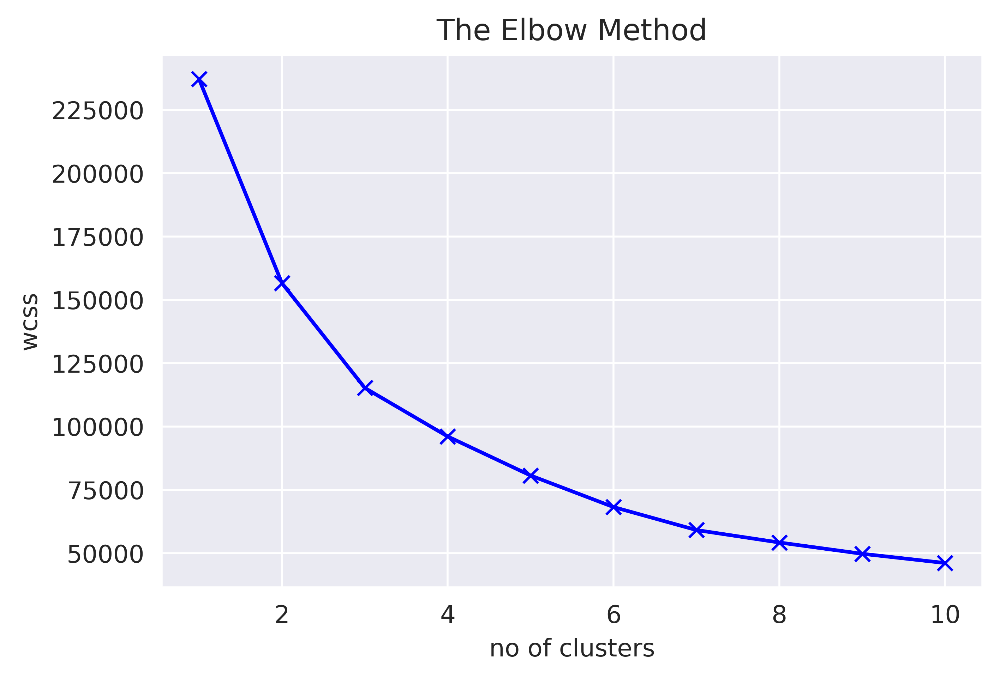

In [75]:
#Visualizing the ELBOW method to get the optimal value of K 
plt.plot(range(1,11), wcss,'bx-')
plt.title('The Elbow Method')
plt.xlabel('no of clusters')
plt.ylabel('wcss')
plt.show()

In [76]:
# Number of the clusters looks like 3

In [77]:
kmeans = KMeans(n_clusters= 3, init='k-means++', random_state=0)
kmeans.fit(X)

KMeans(n_clusters=3, random_state=0)

In [78]:
clusters=kmeans.fit_predict(X)

In [79]:
px.scatter_3d(df2,x='Age',y='Experience',z='Total number of languages known ',color=clusters)

# Doing clustering on the basis of all the data

In [80]:
X=df2.values

In [81]:
wcss=[]
for i in range(1,11):
    kmeans = KMeans(n_clusters= i, init='k-means++', random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

    #inertia_ is the formula used to segregate the data p

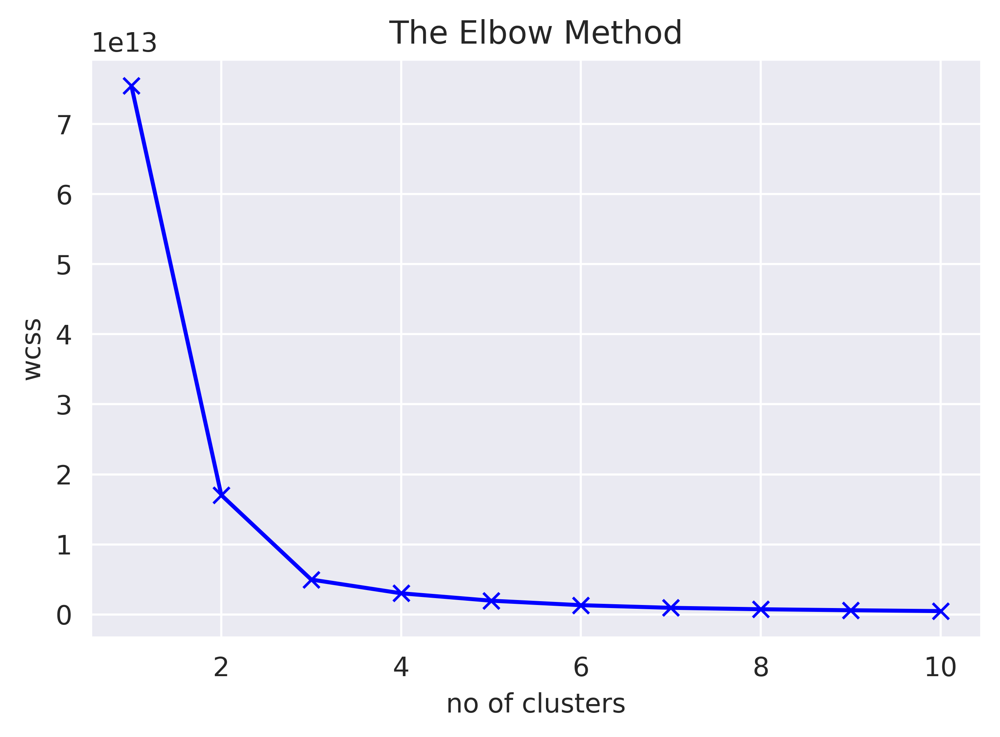

In [82]:
#Visualizing the ELBOW method to get the optimal value of K 
plt.plot(range(1,11), wcss,'bx-')
plt.title('The Elbow Method')
plt.xlabel('no of clusters')
plt.ylabel('wcss')
plt.show()

Still the number of clusters is 3

In [83]:
kmeans = KMeans(n_clusters= 3, init='k-means++', random_state=0)
kmeans.fit(X)

KMeans(n_clusters=3, random_state=0)

In [84]:
clusters=kmeans.fit_predict(X)

In [85]:
df2.corr()

,Age,Gender,Country,Education,Title,Experience,Total number of languages known
Age,1.000000,-0.042963,-0.006755,0.020807,0.040923,0.145788,0.046370
Gender,-0.042963,1.000000,-0.004438,0.015687,-0.015334,0.035635,-0.032618
Country,-0.006755,-0.004438,1.000000,-0.042093,0.036539,-0.015466,-0.026302
Education,0.020807,0.015687,-0.042093,1.000000,0.106617,0.295113,-0.162222
Title,0.040923,-0.015334,0.036539,0.106617,1.000000,0.159531,-0.196063
Experience,0.145788,0.035635,-0.015466,0.295113,0.159531,1.000000,-0.372475
Total number of languages known,0.046370,-0.032618,-0.026302,-0.162222,-0.196063,-0.372475,1.000000


In [86]:
px.scatter_3d(df2,x='Total number of languages known ',y='Experience',z='Title',color=clusters)

In [87]:
apriori_data=data.iloc[:,7:20]
apriori_data.head()


,Q7_Part_1,Q7_Part_2,Q7_Part_3,Q7_Part_4,Q7_Part_5,Q7_Part_6,Q7_Part_7,Q7_Part_8,Q7_Part_9,Q7_Part_10,Q7_Part_11,Q7_Part_12,Q7_OTHER
0,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...
1,Python,R,SQL,C,NaN,NaN,Javascript,NaN,NaN,NaN,MATLAB,NaN,Other
2,Python,R,SQL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,Java,Javascript,NaN,NaN,Bash,NaN,NaN,NaN
4,Python,NaN,SQL,NaN,NaN,NaN,NaN,NaN,NaN,Bash,NaN,NaN,NaN


In [88]:
apriori_data.columns=[i for i in range(len(apriori_data.columns))]


In [89]:
apriori_data.head()


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...
1,Python,R,SQL,C,NaN,NaN,Javascript,NaN,NaN,NaN,MATLAB,NaN,Other
2,Python,R,SQL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,Java,Javascript,NaN,NaN,Bash,NaN,NaN,NaN
4,Python,NaN,SQL,NaN,NaN,NaN,NaN,NaN,NaN,Bash,NaN,NaN,NaN


In [90]:
!pip install apyori


  Created wheel for apyori: filename=apyori-1.1.2-py3-none-any.whl size=5974 sha256=a8fbfcfc590cce555701e8e6819a6b052b2f895f0d55b4ab16e1f20884ce4f80
  Stored in directory: /root/.cache/pip/wheels/cb/f6/e1/57973c631d27efd1a2f375bd6a83b2a616c4021f24aab84080
Successfully built apyori
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [91]:
import matplotlib.pyplot as plt
from apyori import apriori

In [92]:
records = []
for i in range(0, len(apriori_data)):
    records.append([str(apriori_data.values[i, j]) for j in range(0, 10)])

In [93]:
print(type(records))


<class 'list'>


In [94]:
freq_langs = apriori(records, min_support=0.0045, min_confidence=0.2, min_lift=3, min_length=2)
results = list(freq_langs)

In [95]:
print("There are {} Relation derived.".format(len(results)))


There are 187 Relation derived.


In [96]:
for i in range(0, len(results)):
    print(results[i][0])


frozenset({'C++', 'C'})
frozenset({'Swift', 'Javascript'})
frozenset({'Bash', 'C++', 'C'})
frozenset({'Bash', 'Java', 'Javascript'})
frozenset({'C++', 'Java', 'C'})
frozenset({'C++', 'C', 'Javascript'})
frozenset({'C++', 'Python', 'C'})
frozenset({'C++', 'R', 'C'})
frozenset({'C++', 'SQL', 'C'})
frozenset({'C++', 'C', 'nan'})
frozenset({'Java', 'C', 'Javascript'})
frozenset({'SQL', 'Java', 'C'})
frozenset({'C++', 'Java', 'Javascript'})
frozenset({'C++', 'SQL', 'Java'})
frozenset({'SQL', 'Java', 'Javascript'})
frozenset({'Bash', 'C++', 'Java', 'C'})
frozenset({'Bash', 'C++', 'C', 'Javascript'})
frozenset({'Bash', 'C++', 'Python', 'C'})
frozenset({'Bash', 'C++', 'SQL', 'C'})
frozenset({'Bash', 'C++', 'C', 'nan'})
frozenset({'Bash', 'Java', 'C', 'Javascript'})
frozenset({'Bash', 'SQL', 'Java', 'C'})
frozenset({'Bash', 'Python', 'C', 'Javascript'})
frozenset({'Bash', 'SQL', 'C', 'Javascript'})
frozenset({'Bash', 'C++', 'Java', 'Javascript'})
frozenset({'Bash', 'C++', 'SQL', 'Java'})
frozen

In [97]:
lift = []
association = []
for i in range (0, len(results)):
    lift.append(results[:len(results)][i][2][0][3])
    association.append(list(results[:len(results)][i][0]))

In [98]:
rank = pd.DataFrame([association, lift]).transpose()
rank.columns = ['Association', 'Lift']

In [99]:
# Show top 10 higher lift scores
rank.sort_values('Lift', ascending=False).head(10)

,Association,Lift
138,"[Bash, C++, C, Javascript, Python, SQL]",8.30721
67,"[Bash, C++, C, Javascript, SQL]",7.88182
180,"[Bash, C++, C, Javascript, Python, nan, SQL]",7.80444
92,"[C++, Java, C, Javascript, SQL]",7.5323
152,"[C++, Java, C, Javascript, Python, SQL]",7.49563
156,"[C++, Java, C, Javascript, nan, SQL]",7.44174
140,"[Bash, C++, C, Javascript, nan, SQL]",7.4148
182,"[C++, Java, C, Javascript, Python, nan, SQL]",7.39674
66,"[Bash, C++, C, Javascript, Python]",6.81136
172,"[C++, Java, Javascript, Python, SQL, R]",6.79322


In [100]:
apriori_data


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...
1,Python,R,SQL,C,NaN,NaN,Javascript,NaN,NaN,NaN,MATLAB,NaN,Other
2,Python,R,SQL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,Java,Javascript,NaN,NaN,Bash,NaN,NaN,NaN
4,Python,NaN,SQL,NaN,NaN,NaN,NaN,NaN,NaN,Bash,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20032,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20033,Python,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20034,Python,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20035,Python,NaN,SQL,C,NaN,Java,Javascript,NaN,NaN,NaN,NaN,NaN,NaN


In [101]:
# Putting all transactions in a single list
langs = []
for i in range(0, len(records)):
    langs.extend(records[i])

# Finding unique items from transactions
uniquelangs = list(set(langs))

In [102]:
uniquelangs


['C++',
 'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Python',
 'C',
 'nan',
 'Python',
 'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Java',
 'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Javascript',
 'Bash',
 'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - C++',
 'Julia',
 'R',
 'Swift',
 'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - C',
 'Javascript',
 'SQL',
 'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Swift',
 'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - R',
 'Java',
 'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Bash',
 'What pro

In [103]:
records[:5]


[['What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Python',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - R',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - SQL',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - C',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - C++',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Java',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Javascript',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Julia',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice 

In [104]:
# remove nan values:-
record = []
for sublist in records:
    clean_sublist = [item for item in sublist if item is not np.nan]
    record.append(clean_sublist)
    
#In eclat we have to change data to 0 1 format :-

from mlxtend.preprocessing import TransactionEncoder
te = TransactionEncoder()
te_ary = te.fit(record).transform(record)
df_x = pd.DataFrame(te_ary, columns=te.columns_) # encoding

In [105]:
pair = []
for j in range(0, len(uniquelangs)):
    k = 1;
    while k <= len(uniquelangs):
        try:
            pair.append([uniquelangs[j], uniquelangs[j+k]])
        except IndexError:
            pass
        k = k + 1;

In [106]:
pair
pairs=[]
for i in pair :
    if 'nan' in i:
        continue
        
    else:
        pairs.append(i)

In [107]:
score = []
for i in pairs:
    cond = []
    for lang in i:
        cond.append('("%s") in s' %lang)
    mycode = ('[s for s in record if ' + ' and '.join(cond) + ']')
    #mycode = "print 'hello world'"
    score.append(len(eval(mycode))/len(apriori_data))

In [108]:
ranking_ECLAT = pd.DataFrame([pairs, score]).transpose()
ranking_ECLAT.columns = ['Pair', 'Score']

In [109]:
ranking_ECLAT.sort_values('Score', ascending=False).head(10)


,Pair,Score
63,"[Python, SQL]",0.332734
59,"[Python, R]",0.175775
2,"[C++, Python]",0.172082
37,"[C, Python]",0.148176
66,"[Python, Java]",0.14588
62,"[Python, Javascript]",0.130209
138,"[R, SQL]",0.114289
171,"[SQL, Java]",0.0967211
1,"[C++, C]",0.0950242
162,"[Javascript, SQL]",0.0938763


In [110]:
# Creating trios
trio = []
for j in range(0, len(uniquelangs)):
    for k in range(j, len(uniquelangs)):
        for l in range(k, len(uniquelangs)):
            if (k != j) and (j != l) and (k != l):
                try:
                    trio.append([uniquelangs[j], uniquelangs[j+k], uniquelangs[j+l]])
                except IndexError:
                    pass 

In [111]:
trios=[]
for i in trio:
    if 'nan' in i:
        continue
    else:
        trios.append(i)

In [112]:
trios

[['C++',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Python',
  'C'],
 ['C++',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Python',
  'Python'],
 ['C++',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Python',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Java'],
 ['C++',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Python',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Javascript'],
 ['C++',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Python',
  'Bash'],
 ['C++',
  'What programming languages do you use on a regular basis? (Select all that apply) - Selected Choice - Python'

In [113]:
score_trios = []
for i in trios:
    cond = []
    for lang in i:
        cond.append('("%s") in s' %lang)
    mycode = ('[s for s in record if ' + ' and '.join(cond) + ']')
    #mycode = "print 'hello world'"
    score_trios.append(len(eval(mycode))/len(apriori_data))

In [114]:
ranking_ECLAT_trios = pd.DataFrame([trios, score_trios]).transpose()
ranking_ECLAT_trios.columns = ['Trio', 'Score']

In [115]:
ranking_ECLAT_trios.sort_values('Score', ascending=False).head(10)


,Trio,Score
441,"[Python, R, SQL]",0.100963
18,"[C++, C, Python]",0.0864401
474,"[Python, SQL, Java]",0.0863403
465,"[Python, Javascript, SQL]",0.0835454
44,"[C++, Python, SQL]",0.0741129
47,"[C++, Python, Java]",0.0591406
468,"[Python, Javascript, Java]",0.0546988
28,"[C++, C, SQL]",0.0458651
43,"[C++, Python, Javascript]",0.0430703
31,"[C++, C, Java]",0.0413735
